In [1]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from plotly.subplots import make_subplots

# Load penguins dataset
penguins = px.data.penguins()

# Prepare species groups
species_groups = penguins.groupby('species')

# Create figure
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=[species for species in species_groups.groups.keys()])

# Function to add lines and rectangles to each plot
def add_markers(fig, row, species_data, species_name):
    flipper_lengths = species_data['flipper_length_mm'].dropna()
    
    # Calculate statistics
    mean_fl = flipper_lengths.mean()
    median_fl = flipper_lengths.median()
    range_fl = (flipper_lengths.min(), flipper_lengths.max())
    iqr_fl = (np.percentile(flipper_lengths, 25), np.percentile(flipper_lengths, 75))
    std_fl = flipper_lengths.std()
    std_range_fl = (mean_fl - 2*std_fl, mean_fl + 2*std_fl)

    # Add histogram
    fig.add_trace(
        go.Histogram(x=flipper_lengths, name=f'{species_name} Histogram', nbinsx=20),
        row=row, col=1
    )
    
    # Add mean line
    fig.add_vline(x=mean_fl, line=dict(color='blue', dash='dash'), row=row, col=1, annotation_text="Mean", annotation_position="top left")
    
    # Add median line
    fig.add_vline(x=median_fl, line=dict(color='green', dash='dot'), row=row, col=1, annotation_text="Median", annotation_position="top right")

    # Add range rectangle
    fig.add_vrect(x0=range_fl[0], x1=range_fl[1], line_width=0, fillcolor="lightgrey", opacity=0.2, row=row, col=1, annotation_text="Range", annotation_position="bottom left")
    
    # Add IQR rectangle
    fig.add_vrect(x0=iqr_fl[0], x1=iqr_fl[1], line_width=0, fillcolor="lightblue", opacity=0.4, row=row, col=1, annotation_text="IQR", annotation_position="bottom left")
    
    # Add 2 std range rectangle
    fig.add_vrect(x0=std_range_fl[0], x1=std_range_fl[1], line_width=0, fillcolor="lightgreen", opacity=0.2, row=row, col=1, annotation_text="±2 STD", annotation_position="bottom left")

# Plot for each species
for i, (species_name, species_data) in enumerate(species_groups):
    add_markers(fig, row=i+1, species_data=species_data, species_name=species_name)

# Update layout
fig.update_layout(height=900, width=800, title_text="Flipper Length Distribution with Markers")
fig.show()

AttributeError: module 'plotly.express.data' has no attribute 'penguins'

In [2]:
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load penguins dataset from seaborn
penguins = sns.load_dataset("penguins")

# Prepare species groups
species_groups = penguins.groupby('species')

# Create figure
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=[species for species in species_groups.groups.keys()])

# Function to add lines and rectangles to each plot
def add_markers(fig, row, species_data, species_name):
    flipper_lengths = species_data['flipper_length_mm'].dropna()
    
    # Calculate statistics
    mean_fl = flipper_lengths.mean()
    median_fl = flipper_lengths.median()
    range_fl = (flipper_lengths.min(), flipper_lengths.max())
    iqr_fl = (np.percentile(flipper_lengths, 25), np.percentile(flipper_lengths, 75))
    std_fl = flipper_lengths.std()
    std_range_fl = (mean_fl - 2*std_fl, mean_fl + 2*std_fl)

    # Add histogram
    fig.add_trace(
        go.Histogram(x=flipper_lengths, name=f'{species_name} Histogram', nbinsx=20),
        row=row, col=1
    )
    
    # Add mean line
    fig.add_vline(x=mean_fl, line=dict(color='blue', dash='dash'), row=row, col=1, annotation_text="Mean", annotation_position="top left")
    
    # Add median line
    fig.add_vline(x=median_fl, line=dict(color='green', dash='dot'), row=row, col=1, annotation_text="Median", annotation_position="top right")

    # Add range rectangle
    fig.add_vrect(x0=range_fl[0], x1=range_fl[1], line_width=0, fillcolor="lightgrey", opacity=0.2, row=row, col=1, annotation_text="Range", annotation_position="bottom left")
    
    # Add IQR rectangle
    fig.add_vrect(x0=iqr_fl[0], x1=iqr_fl[1], line_width=0, fillcolor="lightblue", opacity=0.4, row=row, col=1, annotation_text="IQR", annotation_position="bottom left")
    
    # Add 2 std range rectangle
    fig.add_vrect(x0=std_range_fl[0], x1=std_range_fl[1], line_width=0, fillcolor="lightgreen", opacity=0.2, row=row, col=1, annotation_text="±2 STD", annotation_position="bottom left")

# Plot for each species
for i, (species_name, species_data) in enumerate(species_groups):
    add_markers(fig, row=i+1, species_data=species_data, species_name=species_name)

# Update layout
fig.update_layout(height=900, width=800, title_text="Flipper Length Distribution with Markers")
fig.show()

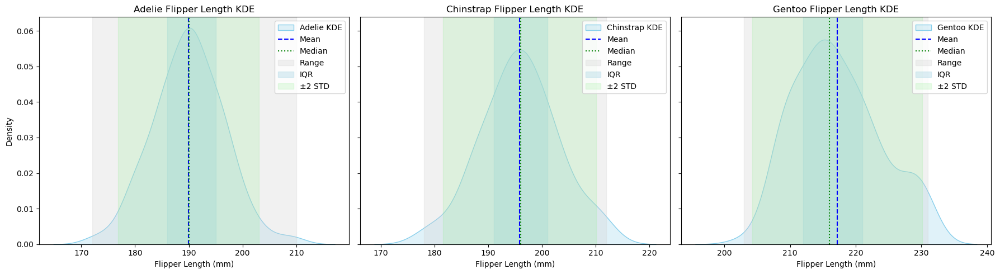

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Load the penguins dataset from seaborn
penguins = sns.load_dataset("penguins")

# Function to add mean, median, and shaded ranges to the KDE plot
def add_markers(flipper_lengths, ax):
    # Calculate statistics
    mean_fl = flipper_lengths.mean()
    median_fl = flipper_lengths.median()
    range_fl = (flipper_lengths.min(), flipper_lengths.max())
    iqr_fl = (np.percentile(flipper_lengths, 25), np.percentile(flipper_lengths, 75))
    std_fl = flipper_lengths.std()
    std_range_fl = (mean_fl - 2*std_fl, mean_fl + 2*std_fl)

    # Plot vertical lines for mean and median
    ax.axvline(mean_fl, color='blue', linestyle='--', label='Mean')
    ax.axvline(median_fl, color='green', linestyle=':', label='Median')
    
    # Add shaded regions for range, IQR, and ±2 STD
    ax.axvspan(range_fl[0], range_fl[1], color='lightgrey', alpha=0.3, label='Range')
    ax.axvspan(iqr_fl[0], iqr_fl[1], color='lightblue', alpha=0.4, label='IQR')
    ax.axvspan(std_range_fl[0], std_range_fl[1], color='lightgreen', alpha=0.2, label='±2 STD')

# Initialize the plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Iterate over each species
species_list = penguins['species'].unique()
for i, species in enumerate(species_list):
    species_data = penguins[penguins['species'] == species]
    flipper_lengths = species_data['flipper_length_mm'].dropna()

    # Plot KDE for the current species
    sns.kdeplot(flipper_lengths, ax=axes[i], fill=True, color="skyblue", label=f'{species} KDE')
    
    # Add mean, median, and range markers
    add_markers(flipper_lengths, axes[i])
    
    # Set title and labels
    axes[i].set_title(f'{species} Flipper Length KDE')
    axes[i].set_xlabel('Flipper Length (mm)')
    if i == 0:
        axes[i].set_ylabel('Density')

# Display legend and adjust layout
for ax in axes:
    ax.legend()

plt.tight_layout()
plt.show()

3. I prefer KDEs for most cases because they provide a smooth, continuous view of the data, helping to reveal detailed patterns like multimodal distributions or subtle skews. Unlike histograms, KDEs avoid arbitrary binning and give a more refined visual. However, for smaller datasets or when highlighting outliers, I prefer box plots for their clarity in summarizing key statistics like the median and quartiles.

https://chatgpt.com/share/66f4cca4-95b4-800f-ae8a-bb71eafb2feb

In [4]:
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

n = 1500
data1 = stats.uniform.rvs(0, 10, size=n)
data2 = stats.norm.rvs(5, 1.5, size=n)
data3 = np.r_[stats.norm.rvs(2, 0.25, size=int(n/2)), stats.norm.rvs(8, 0.5, size=int(n/2))]
data4 = stats.norm.rvs(6, 0.5, size=n)

fig = make_subplots(rows=1, cols=4)

fig.add_trace(go.Histogram(x=data1, name='A', nbinsx=30, marker=dict(line=dict(color='black', width=1))), row=1, col=1)
fig.add_trace(go.Histogram(x=data2, name='B', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=2)
fig.add_trace(go.Histogram(x=data3, name='C', nbinsx=45, marker=dict(line=dict(color='black', width=1))), row=1, col=3)
fig.add_trace(go.Histogram(x=data4, name='D', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=4)

fig.update_layout(height=300, width=750, title_text="Row of Histograms")
fig.update_xaxes(title_text="A", row=1, col=1)
fig.update_xaxes(title_text="B", row=1, col=2)
fig.update_xaxes(title_text="C", row=1, col=3)
fig.update_xaxes(title_text="D", row=1, col=4)
fig.update_xaxes(range=[-0.5, 10.5])

for trace in fig.data:
    trace.xbins = dict(start=0, end=10)
    
# This code was produced by just making requests to Microsoft Copilot
# https://github.com/pointOfive/stat130chat130/blob/main/CHATLOG/wk3/COP/SLS/0001_concise_makeAplotV1.md

fig.show() # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS

4.1. B and D have same similar means and similar variances
  2. A and B have same similar means but quite different variances
  3. no dataset have similar variances but quite different means
  4. A and D have quite different means and quite different variances

5. In a right-skewed distribution, the mean is greater than the median because the longer tail on the right pulls the mean toward higher values.
In a left-skewed distribution, the mean is less than the median because the longer tail on the left pulls the mean toward lower values.
https://chatgpt.com/share/66f4d5b1-d588-800f-bc05-31990f9d8dc3

Summary Statistics:
               year  theme_id  num_parts
count     6.000000  6.000000     6.0000
mean   1969.833333  2.000000   145.0000
std      15.367715  0.894427    71.7635
min    1950.000000  1.000000    50.0000
25%    1957.250000  1.250000   105.0000
50%    1979.500000  2.000000   135.0000
75%    1980.000000  2.750000   187.5000
max    1980.000000  3.000000   250.0000


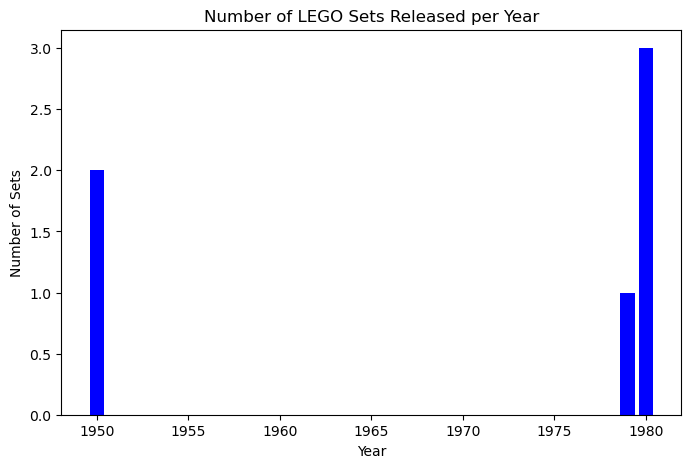

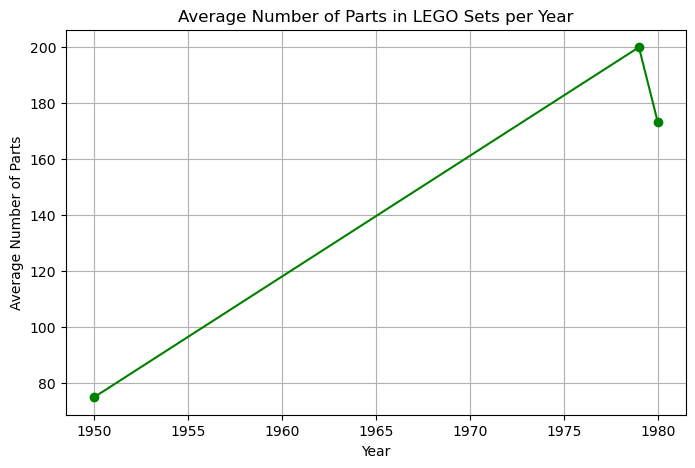

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Sample LEGO dataset
lego_data = pd.DataFrame({
    'set_num': ['001-1', '002-1', '003-1', '001-2', '002-2', '003-2'],
    'name': ['VW Bug', 'Truck', 'Space Cruiser', 'Tractor', 'Helicopter', 'Space Shuttle'],
    'year': [1950, 1950, 1979, 1980, 1980, 1980],
    'theme_id': [1, 2, 3, 1, 2, 3],
    'num_parts': [100, 50, 200, 150, 120, 250]
})

# Summary statistics
summary_stats = lego_data.describe()
print("Summary Statistics:\n", summary_stats)

# Plot for the number of LEGO sets released per year
set_count_per_year = lego_data['year'].value_counts().sort_index()
plt.figure(figsize=(8, 5))
plt.bar(set_count_per_year.index, set_count_per_year.values, color='blue')
plt.title("Number of LEGO Sets Released per Year")
plt.xlabel("Year")
plt.ylabel("Number of Sets")
plt.show()

# Plot for the average number of parts in LEGO sets per year
avg_parts_per_year = lego_data.groupby('year')['num_parts'].mean()
plt.figure(figsize=(8, 5))
plt.plot(avg_parts_per_year.index, avg_parts_per_year.values, marker='o', color='green')
plt.title("Average Number of Parts in LEGO Sets per Year")
plt.xlabel("Year")
plt.ylabel("Average Number of Parts")
plt.grid(True)
plt.show()

# Saving the dataset to a CSV file (if you need to save it locally)
lego_data.to_csv("lego_dataset_analysis.csv", index=False)

6. 1.Summary Statistics:
The dataset includes LEGO sets released between 1950 and 1980.
The average number of parts per set is 145, with a range from 50 parts to 250 parts.
There is a steady increase in the complexity of sets (more parts) as we move through the years.
2.Visualizations:
The first plot shows the number of LEGO sets released per year. There was a notable increase in set releases in 1980.
The second plot displays the average number of parts per set over the years. It shows a rise in the average number of parts, indicating that sets became more intricate over time.


In [3]:
import pandas as pd
import plotly.express as px

# Load the dataset
bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')

# Make identical boy and girl names distinct by appending sex to the name
bn['name'] = bn['name'] + " " + bn['sex']

# Sort values by name and year
bn = bn.sort_values(['name', 'year'])

# Calculate the rank of each name in each year
bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)

# Calculate the percent change in name popularity from the last year for each name
bn['percent change'] = bn.groupby('name')['percent'].diff()

# Handle new names by setting their percent change to the original percent value
new_name = bn['name'] != bn['name'].shift(1)
bn.loc[new_name, 'percent change'] = bn.loc[new_name, 'percent']

# Filter out less common names (only keep names with percent > 0.001)
bn = bn[bn['percent'] > 0.001]

# Sort by year for better plotting
bn = bn.sort_values('year')

# Create the animated scatter plot
fig = px.scatter(bn, 
                 x="percent change", 
                 y="rank", 
                 animation_frame="year", 
                 animation_group="name", 
                 size="percent", 
                 color="sex", 
                 hover_name="name",
                 size_max=50, 
                 range_x=[-0.005, 0.005])

# Reverse the y-axis so that rank 1 is on top
fig.update_yaxes(autorange='reversed')

# Display the dynamic plot
fig.show()  # This will create a dynamic HTML plot with animation

9. yes